In [7]:
import numpy as np
import matplotlib.pyplot as plt
import torch.nn.functional as F
import torch.nn as nn
import torch
import gc
import os
import imageio
import yaml
from torch.optim import Adam
from datetime import datetime
from PIL import Image
import requests
from typing import Tuple

## 2D Gaussian Splatting ##

The core function for generating 2D Gaussian Splatting. The core mechanic of this function is as follow

> Constructs a 2D Gaussian kernel using provided batch of sigma_x, sigma_y, and rho
\begin{equation} \sigma_x, \sigma_y, \rho\ \end{equation}


> Normalises and reshapes the kernel to RGB channels, pads to match the image size, and translates based on given coords. Basically poutting the relevant kernel in the relevant coordinate position.


> Multiplies the RGB kernels with given colours, sums up the layers, and returns the final clamped and permuted image.

In [8]:
def generate_2D_gaussian_splatting(kernel_size: int, 
                                   sigma_x: torch.Tensor, 
                                   sigma_y: torch.Tensor, 
                                   rho: torch.Tensor, 
                                   coords: torch.Tensor, 
                                   colours: torch.Tensor, 
                                   image_size: Tuple[int, int, int] = (256, 256, 3), 
                                   device: str = "cpu") -> torch.Tensor:
    """
    Generate a 2D Gaussian Splatting image.
    """

    # Get the number of splats (batch size)
    batch_size = colours.shape[0]

    # Reshape the standard deviations and correlation coefficient tensors to match the batch size
    sigma_x = sigma_x.view(batch_size, 1, 1)
    sigma_y = sigma_y.view(batch_size, 1, 1)
    rho = rho.view(batch_size, 1, 1)

    # Create the covariance matrix for each splat
    covariance = torch.stack(
        [torch.stack([sigma_x**2, rho*sigma_x*sigma_y], dim=-1),
        torch.stack([rho*sigma_x*sigma_y, sigma_y**2], dim=-1)],
        dim=-2
    )

    # Check if the covariance matrix is positive semi-definite
    determinant = (sigma_x**2) * (sigma_y**2) - (rho * sigma_x * sigma_y)**2
    if (determinant <= 0).any():
        raise ValueError("Covariance matrix must be positive semi-definite")

    # Compute the inverse of the covariance matrix
    inv_covariance = torch.inverse(covariance)

    # Create a linspace tensor for the kernel
    start = torch.tensor([-5.0], device=device).view(-1, 1)
    end = torch.tensor([5.0], device=device).view(-1, 1)
    base_linspace = torch.linspace(0, 1, steps=kernel_size, device=device)
    ax_batch = start + (end - start) * base_linspace

    # Expand the linspace tensor in both x and y directions
    ax_batch_expanded_x = ax_batch.unsqueeze(-1).expand(-1, -1, kernel_size)
    ax_batch_expanded_y = ax_batch.unsqueeze(1).expand(-1, kernel_size, -1)

    # Create the x and y coordinates for the Gaussian kernel
    xx, yy = ax_batch_expanded_x, ax_batch_expanded_y

    # Stack the x and y coordinates
    xy = torch.stack([xx, yy], dim=-1)

    # Compute the Gaussian kernel
    z = torch.einsum('b...i,b...ij,b...j->b...', xy, -0.5 * inv_covariance, xy)
    kernel = torch.exp(z) / (2 * torch.tensor(np.pi, device=device) * torch.sqrt(torch.det(covariance)).view(batch_size, 1, 1))

    # Normalize the kernel
    kernel_max_1, _ = kernel.max(dim=-1, keepdim=True)
    kernel_max_2, _ = kernel_max_1.max(dim=-2, keepdim=True)
    kernel_normalized = kernel / kernel_max_2

    # Reshape the kernel to match the RGB channels
    kernel_reshaped = kernel_normalized.repeat(1, 3, 1).view(batch_size * 3, kernel_size, kernel_size)
    kernel_rgb = kernel_reshaped.unsqueeze(0).reshape(batch_size, 3, kernel_size, kernel_size)

    # Compute the padding for the kernel
    pad_h = image_size[0] - kernel_size
    pad_w = image_size[1] - kernel_size

    # Check if the kernel size is smaller or equal to the image size
    if pad_h < 0 or pad_w < 0:
        raise ValueError("Kernel size should be smaller or equal to the image size.")

    # Pad the kernel to match the image size
    padding = (pad_w // 2, pad_w // 2 + pad_w % 2, pad_h // 2, pad_h // 2 + pad_h % 2)
    kernel_rgb_padded = torch.nn.functional.pad(kernel_rgb, padding, "constant", 0)

    # Create an affine transformation matrix
    b, c, h, w = kernel_rgb_padded.shape
    theta = torch.zeros(b, 2, 3, dtype=torch.float32, device=device)
    theta[:, 0, 0] = 1.0
    theta[:, 1, 1] = 1.0
    theta[:, :, 2] = coords

    # Apply the affine transformation to the kernel
    grid = F.affine_grid(theta, size=(b, c, h, w), align_corners=True)
    kernel_rgb_padded_translated = F.grid_sample(kernel_rgb_padded, grid, align_corners=True)

    # Multiply the kernel by the RGB values
    rgb_values_reshaped = colours.unsqueeze(-1).unsqueeze(-1)
    final_image_layers = rgb_values_reshaped * kernel_rgb_padded_translated

    # Sum the layers to create the final image
    final_image = final_image_layers.sum(dim=0)

    # Clamp the final image values between 0 and 1
    final_image = torch.clamp(final_image, 0, 1)

    # Permute the final image to match the RGB channels
    final_image = final_image.permute(1, 2, 0)

    # Return the final image
    return final_image

# Example Usage

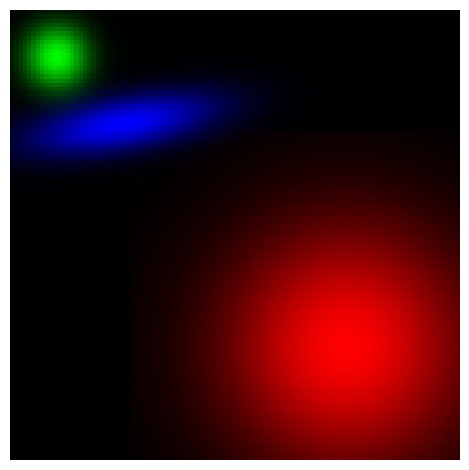

In [9]:
device = "cpu"
kernel_size = 101  # You can adjust the kernel size as needed
rho = torch.tensor([0.0, 0.0, -0.5], device=device)
sigma_x = torch.tensor([2.0, 0.5, 0.5], device=device)
sigma_y = torch.tensor([2.0, 0.5, 1.5], device=device)
vectors = torch.tensor([(-0.5, -0.5), (0.8, 0.8), (0.5, 0.5)], device=device)
colours = torch.tensor([(1.0, 0.0, 0.0), (0.0, 1.0, 0.0), (0.0, 0.0, 1.0)], device=device)
img_size = (105, 105, 3)

final_image = generate_2D_gaussian_splatting(kernel_size, sigma_x, sigma_y, rho, vectors, colours, img_size, device=device)

plt.imshow(final_image.detach().cpu().numpy())
plt.axis("off")
plt.tight_layout()
plt.show()

## Structural Similarity Index (SSIM) ##
This function calculates the combined loss by taking the weighted sum of L1 (mean absolute error) loss and the SSIM-based loss, controlled by lambda_param. This approach might be used to balance the importance of pixel-level accuracy (L1) and perceptual quality (SSIM) in the training of neural networks.

In [10]:
def create_window(window_size: int, channel: int) -> torch.Tensor:
    """
    Create a 2D Gaussian window tensor.

    Args:
        window_size (int): Size of the window.
        channel (int): Number of channels.

    Returns:
        torch.Tensor: 2D Gaussian window tensor.
    """
    def gaussian(window_size: int, sigma: float) -> torch.Tensor:
        """
        Create a 1D Gaussian tensor.

        Args:
            window_size (int): Size of the window.
            sigma (float): Standard deviation of the Gaussian.

        Returns:
            torch.Tensor: 1D Gaussian tensor.
        """
        gauss = torch.exp(torch.tensor([-(x - window_size//2)**2/float(2*sigma**2) for x in range(window_size)]))
        return gauss / gauss.sum()

    _1D_window = gaussian(window_size, 1.5).unsqueeze(1)
    _2D_window = _1D_window.mm(_1D_window.t()).float().unsqueeze(0).unsqueeze(0)
    window = torch.autograd.Variable(_2D_window.expand(channel, 1, window_size, window_size).contiguous())

    return window


def ssim(img1: torch.Tensor, img2: torch.Tensor, window_size: int = 11, size_average: bool = True) -> torch.Tensor:
    """
    Calculate the Structural Similarity Index (SSIM) between two images.

    Args:
        img1 (torch.Tensor): First image tensor.
        img2 (torch.Tensor): Second image tensor.
        window_size (int, optional): Size of the window. Defaults to 11.
        size_average (bool, optional): Whether to average the SSIM values. Defaults to True.

    Returns:
        torch.Tensor: SSIM values.
    """
    (_, _, channel) = img1.size()

    img1 = img1.unsqueeze(0).permute(0, 3, 1, 2)
    img2 = img2.unsqueeze(0).permute(0, 3, 1, 2)

    C1 = 0.01**2
    C2 = 0.03**2

    window = create_window(window_size, channel)

    if img1.is_cuda:
        window = window.cuda(img1.get_device())
    window = window.type_as(img1)

    mu1 = F.conv2d(img1, window, padding=window_size//2, groups=channel)
    mu2 = F.conv2d(img2, window, padding=window_size//2, groups=channel)
    mu1_sq = mu1.pow(2)
    mu2_sq = mu2.pow(2)
    mu1_mu2 = mu1 * mu2

    sigma1_sq = F.conv2d(img1*img1, window, padding=window_size//2, groups=channel) - mu1_sq
    sigma2_sq = F.conv2d(img2*img2, window, padding=window_size//2, groups=channel) - mu2_sq
    sigma12 = F.conv2d(img1*img2, window, padding=window_size//2, groups=channel) - mu1_mu2

    SSIM_numerator = ((2*mu1_mu2 + C1)*(2*sigma12 + C2))
    SSIM_denominator = ((mu1_sq + mu2_sq + C1)*(sigma1_sq + sigma2_sq + C2))
    SSIM = SSIM_numerator / SSIM_denominator

    return torch.clamp((1 - SSIM) / 2, 0, 1)


def d_ssim_loss(img1: torch.Tensor, img2: torch.Tensor, window_size: int = 11, size_average: bool = True) -> torch.Tensor:
    """
    Calculate the differentiable SSIM loss between two images.

    Args:
        img1 (torch.Tensor): First image tensor.
        img2 (torch.Tensor): Second image tensor.
        window_size (int, optional): Size of the window. Defaults to 11.
        size_average (bool, optional): Whether to average the loss. Defaults to True.

    Returns:
        torch.Tensor: Differentiable SSIM loss.
    """
    return ssim(img1, img2, window_size, size_average).mean()


def combined_loss(pred: torch.Tensor, target: torch.Tensor, lambda_param: float = 0.5) -> torch.Tensor:
    """
    Calculate the combined loss using L1 loss and differentiable SSIM loss.

    Args:
        pred (torch.Tensor): Predicted image tensor.
        target (torch.Tensor): Target image tensor.
        lambda_param (float, optional): Weighting parameter for SSIM loss. Defaults to 0.5.

    Returns:
        torch.Tensor: Combined loss.
    """
    l1loss = nn.L1Loss()
    return (1 - lambda_param) * l1loss(pred, target) + lambda_param * d_ssim_loss(pred, target)

# Load Config

In [12]:
# Read the config.yml file
with open('config.yaml', 'r') as config_file:
    config = yaml.safe_load(config_file)

# Extract values from the loaded config
KERNEL_SIZE = config["KERNEL_SIZE"]
image_size = tuple(config["image_size"])
primary_samples = config["primary_samples"]
backup_samples = config["backup_samples"]
num_epochs = config["num_epochs"]
densification_interval = config["densification_interval"]
learning_rate = config["learning_rate"]
image_file_name = config["image_file_name"]
display_interval = config["display_interval"]
grad_threshold = config["gradient_threshold"]
gauss_threshold = config["gaussian_threshold"]
display_loss = config["display_loss"]

# Prepare the points

In [13]:
def give_required_data(input_coords, image_size):

  # normalising pixel coordinates [-1,1]
  coords = torch.tensor(input_coords / [image_size[0],image_size[1]], device=device).float()
  center_coords_normalized = torch.tensor([0.5, 0.5], device=device).float()
  coords = (center_coords_normalized - coords) * 2.0

  # Fetching the colour of the pixels in each coordinates
  colour_values = [image_array[coord[1], coord[0]] for coord in input_coords]
  colour_values_np = np.array(colour_values)
  colour_values_tensor =  torch.tensor(colour_values_np, device=device).float()

  return colour_values_tensor, coords

In [30]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
num_samples = primary_samples + backup_samples

PADDING = KERNEL_SIZE // 2
image_path = image_file_name
original_image = Image.open(image_path)
original_image = original_image.resize((image_size[0],image_size[0]))
original_image = original_image.convert('RGB')
original_array = np.array(original_image)
original_array = original_array / 255.0
width, height, _ = original_array.shape

image_array = original_array
target_tensor = torch.tensor(image_array, dtype=torch.float32, device=device)
coords = np.random.randint(0, [width, height], size=(num_samples, 2))
random_pixel_means = torch.tensor(coords, device=device)
pixels = [image_array[coord[0], coord[1]] for coord in coords]
pixels_np = np.array(pixels)
random_pixels =  torch.tensor(pixels_np, device=device)

colour_values, pixel_coords = give_required_data(coords, image_size)

pixel_coords = torch.atanh(pixel_coords)

sigma_values = torch.rand(num_samples, 2, device=device)
rho_values = 2 * torch.rand(num_samples, 1, device=device) - 1
alpha_values = torch.ones(num_samples, 1, device=device)
W_values = torch.cat([sigma_values, rho_values, alpha_values, colour_values, pixel_coords], dim=1)

In [17]:
starting_size = primary_samples
left_over_size = backup_samples
persistent_mask = torch.cat([torch.ones(starting_size, dtype=bool),torch.zeros(left_over_size, dtype=bool)], dim=0)
current_marker = starting_size

In [16]:
# Get current date and time as string
now = datetime.now().strftime("%Y_%m_%d-%H_%M_%S")

# Create a directory with the current date and time as its name
directory = f"{now}"
os.makedirs(directory, exist_ok=True)

In [15]:
W = nn.Parameter(W_values)
optimizer = Adam([W], lr=learning_rate)
loss_history = []

# Training loop

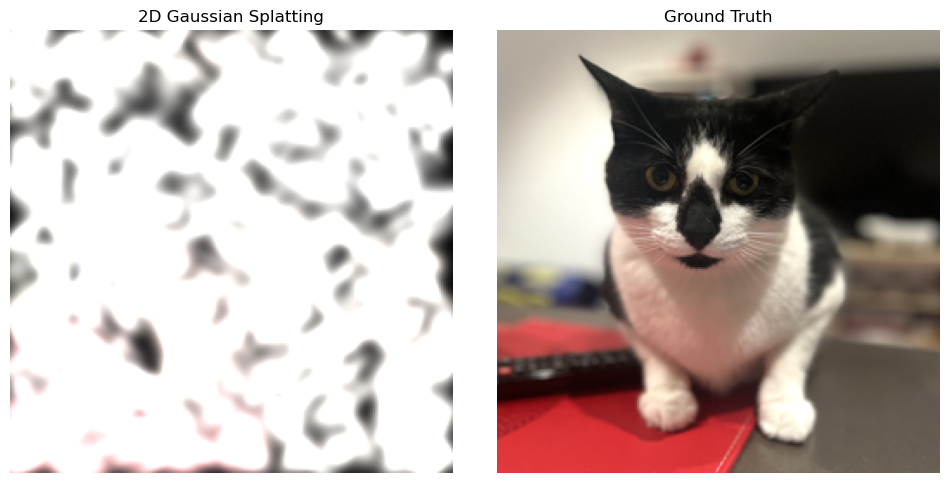

Epoch 1/2001, Loss: 0.47337034344673157, on 1000 points


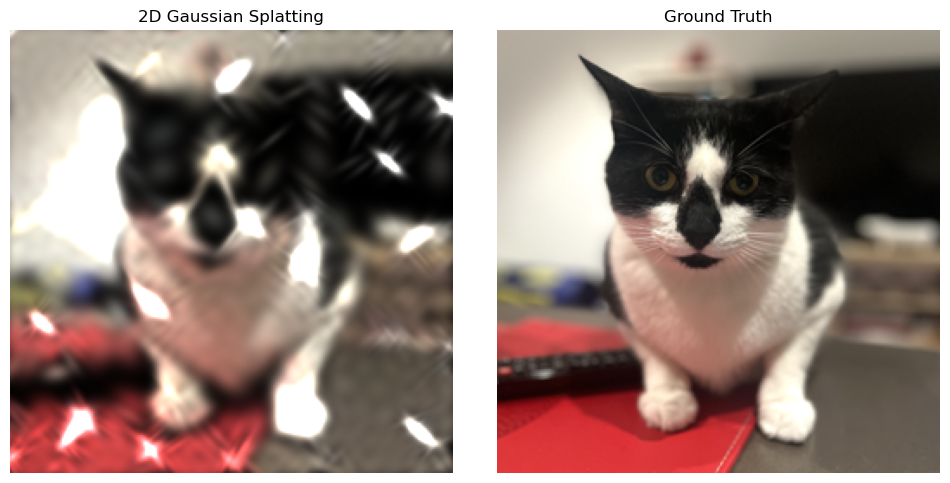

Epoch 101/2001, Loss: 0.06208784878253937, on 1000 points


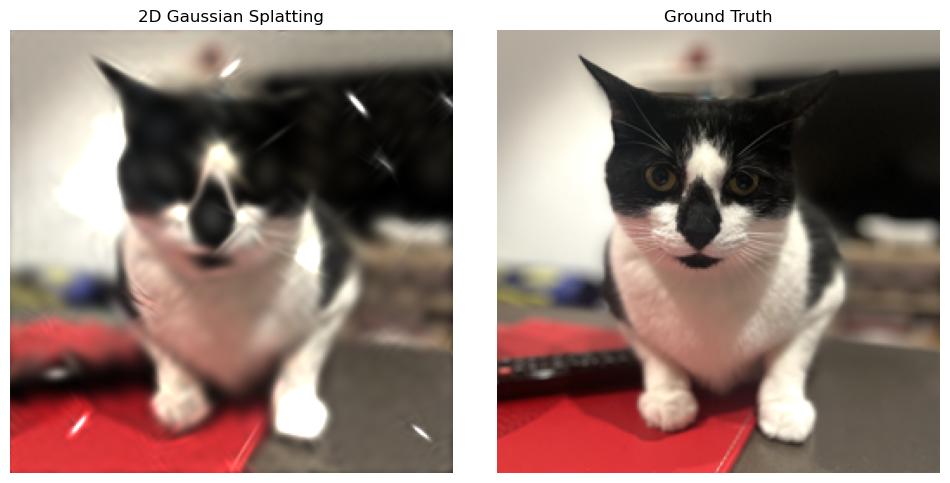

Epoch 201/2001, Loss: 0.026979634538292885, on 1000 points
number of splitted points: 206


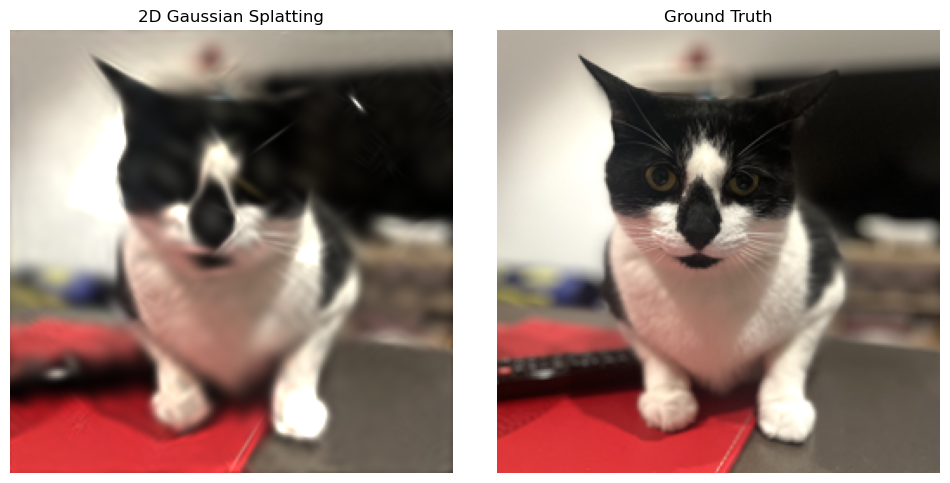

Epoch 301/2001, Loss: 0.019790880382061005, on 1000 points


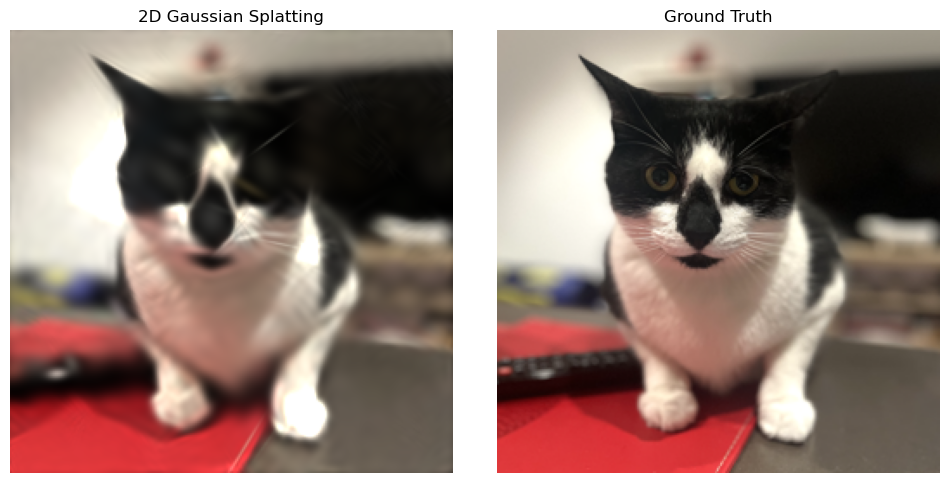

Epoch 401/2001, Loss: 0.017517033964395523, on 1206 points


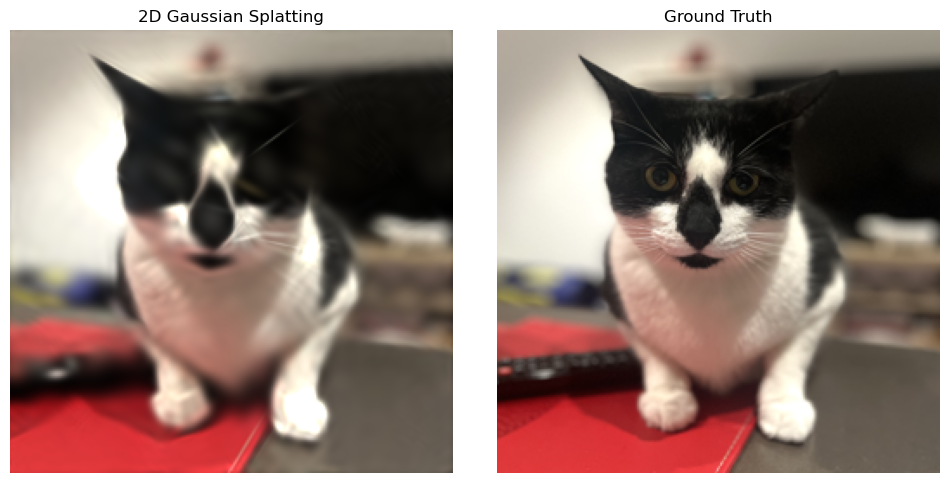

Epoch 501/2001, Loss: 0.01614292524755001, on 1206 points
number of splitted points: 265


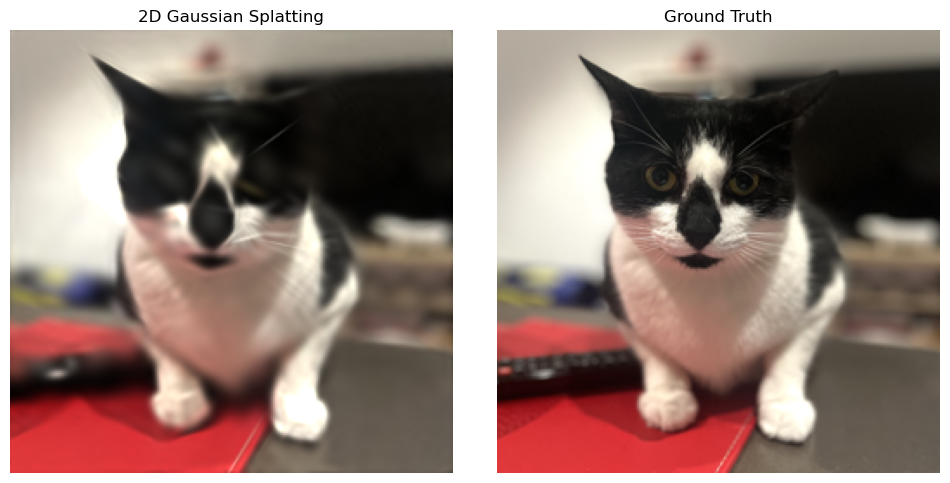

Epoch 601/2001, Loss: 0.015304136089980602, on 1206 points


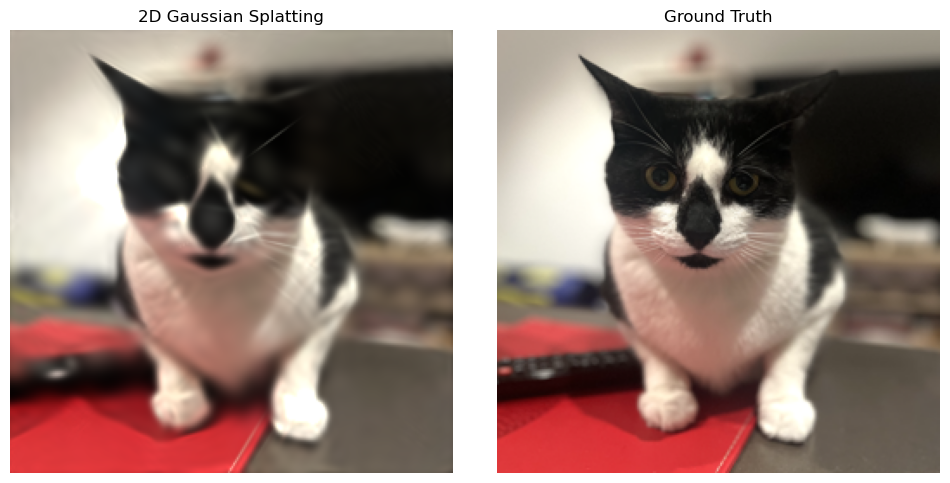

Epoch 701/2001, Loss: 0.014677243307232857, on 1471 points


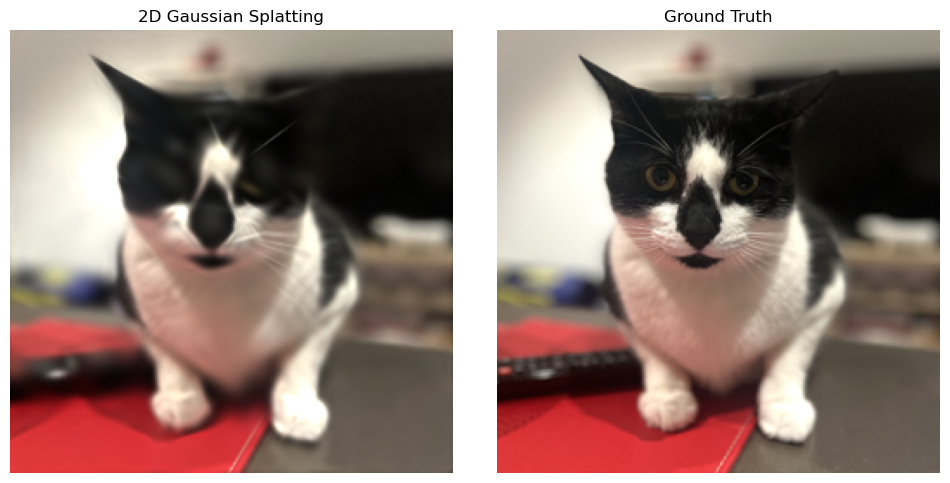

Epoch 801/2001, Loss: 0.013928266242146492, on 1471 points
number of splitted points: 314


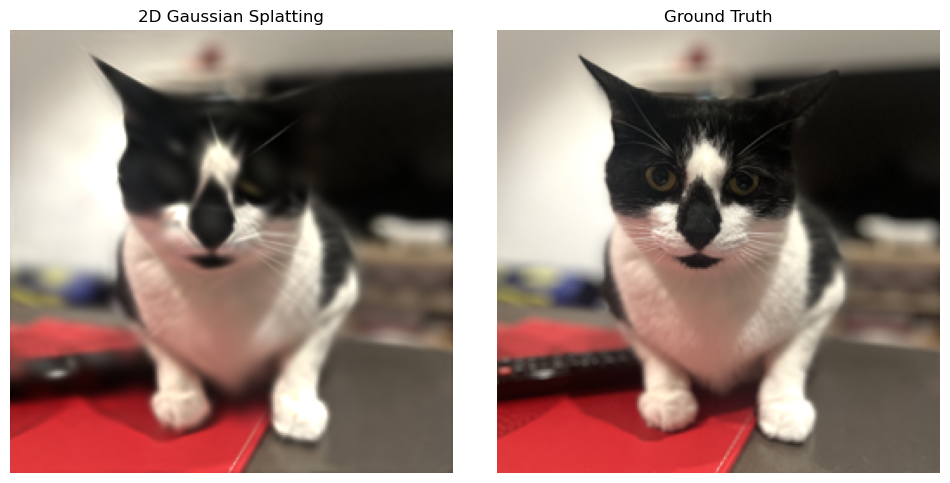

Epoch 901/2001, Loss: 0.01319887489080429, on 1471 points


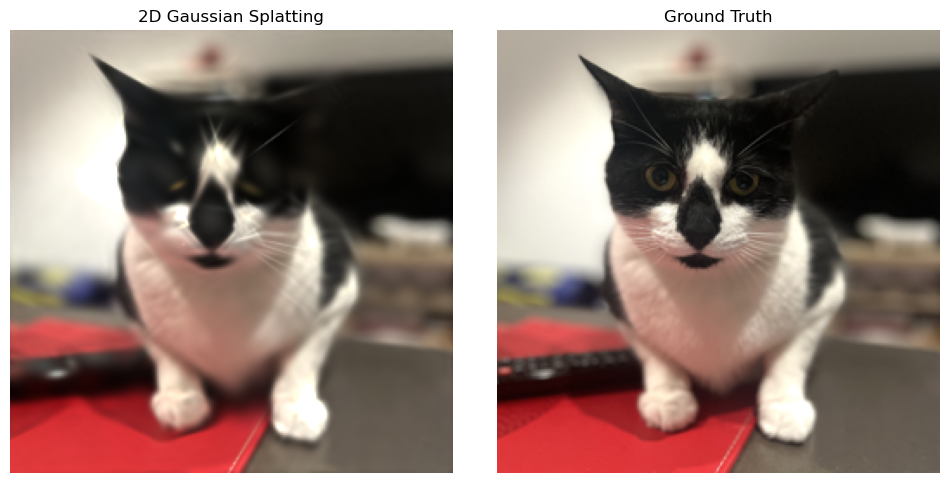

Epoch 1001/2001, Loss: 0.012608942575752735, on 1785 points


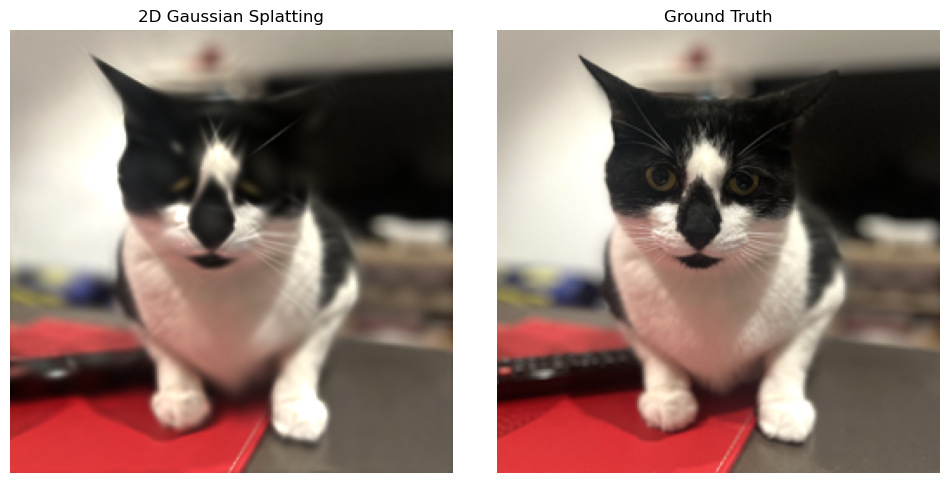

Epoch 1101/2001, Loss: 0.012188311666250229, on 1785 points
number of splitted points: 368


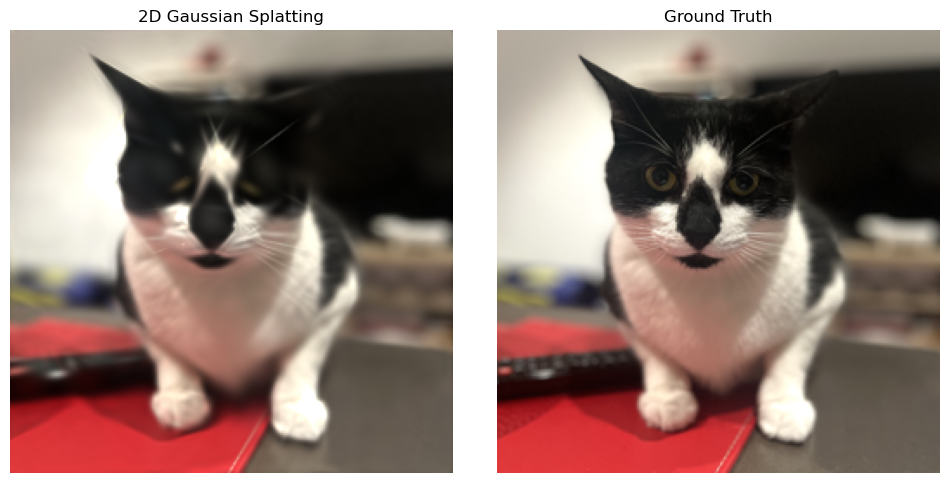

Epoch 1201/2001, Loss: 0.011792635545134544, on 1785 points


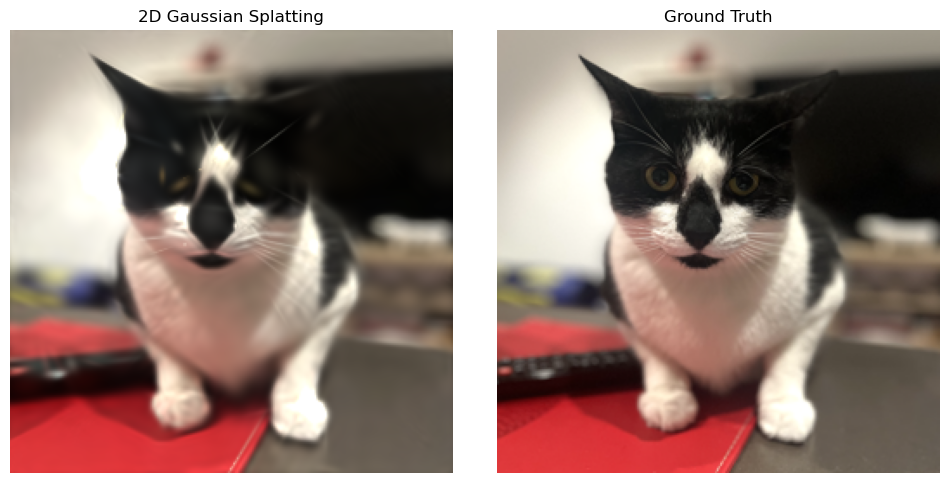

Epoch 1301/2001, Loss: 0.011409545317292213, on 2153 points


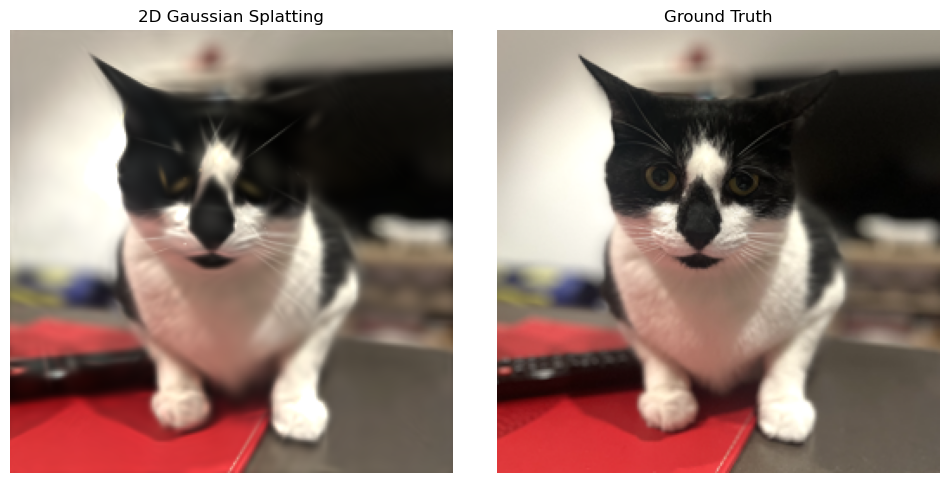

Epoch 1401/2001, Loss: 0.010843303054571152, on 2153 points
number of splitted points: 357


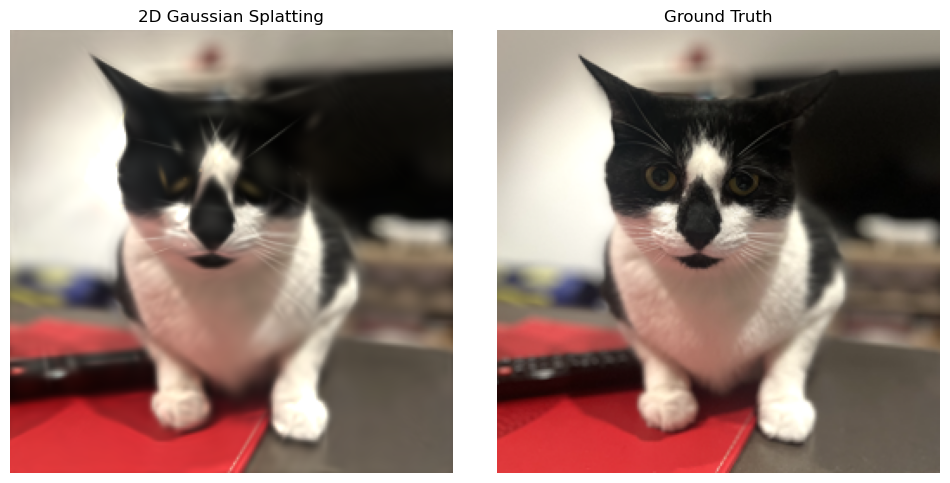

Epoch 1501/2001, Loss: 0.010563116520643234, on 2153 points


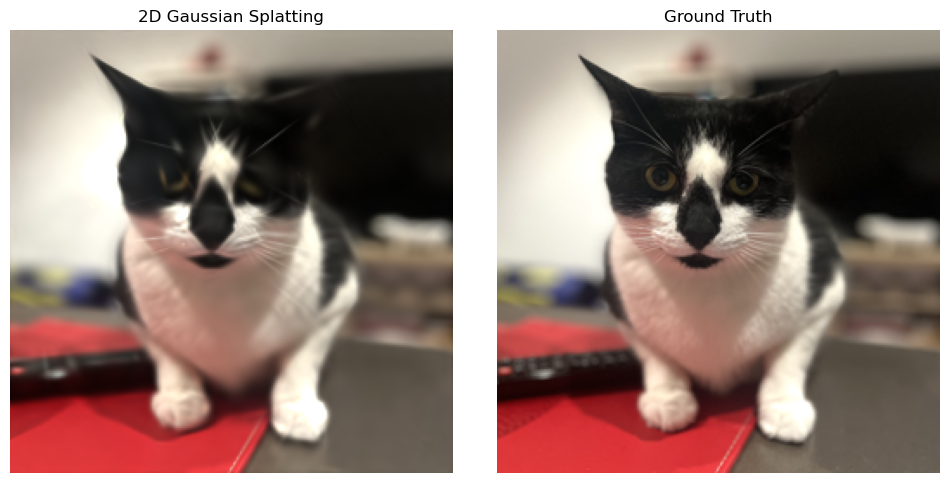

Epoch 1601/2001, Loss: 0.010037141852080822, on 2510 points


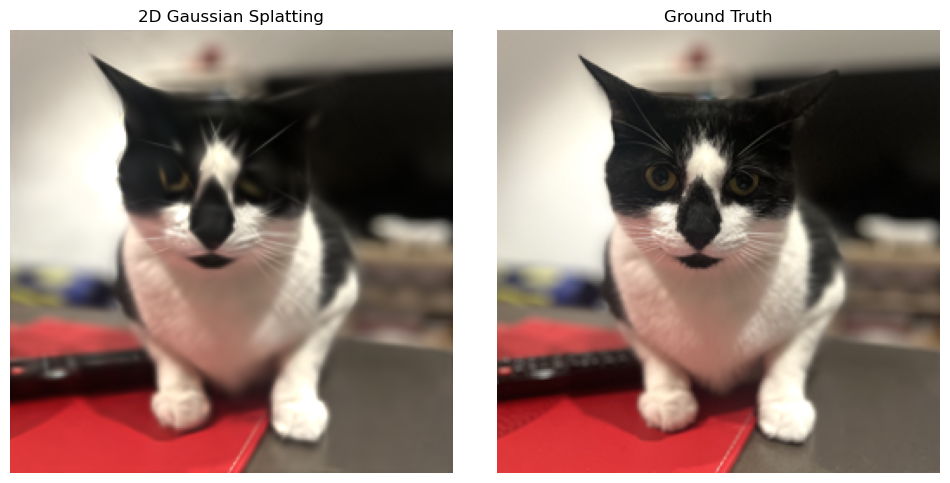

Epoch 1701/2001, Loss: 0.009778858162462711, on 2510 points
number of splitted points: 329


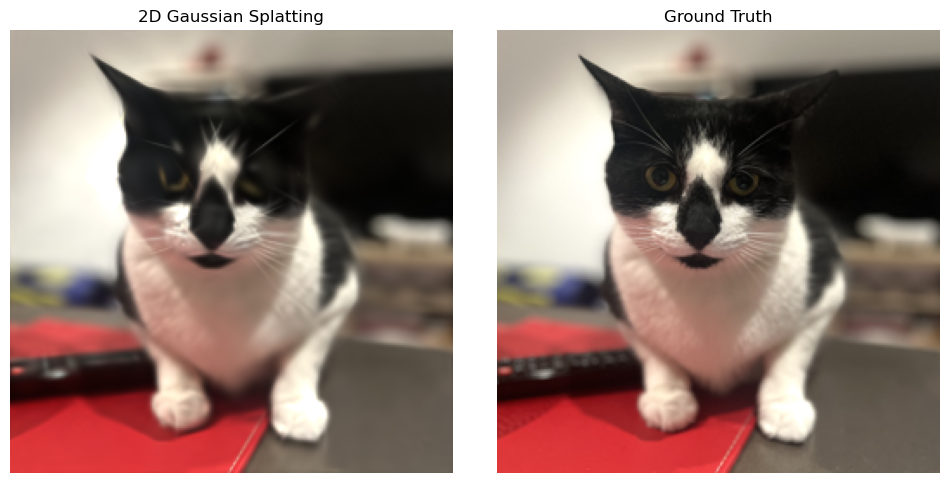

Epoch 1801/2001, Loss: 0.009619446471333504, on 2510 points


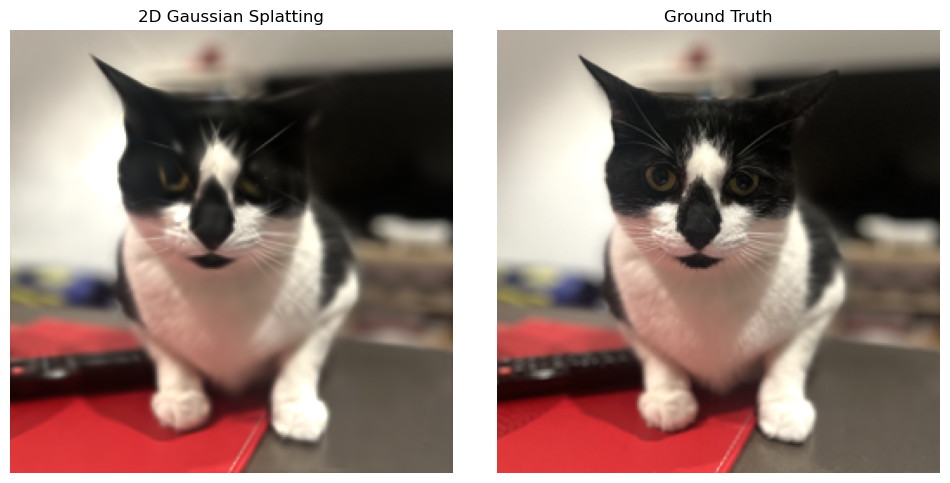

Epoch 1901/2001, Loss: 0.009501039050519466, on 2839 points


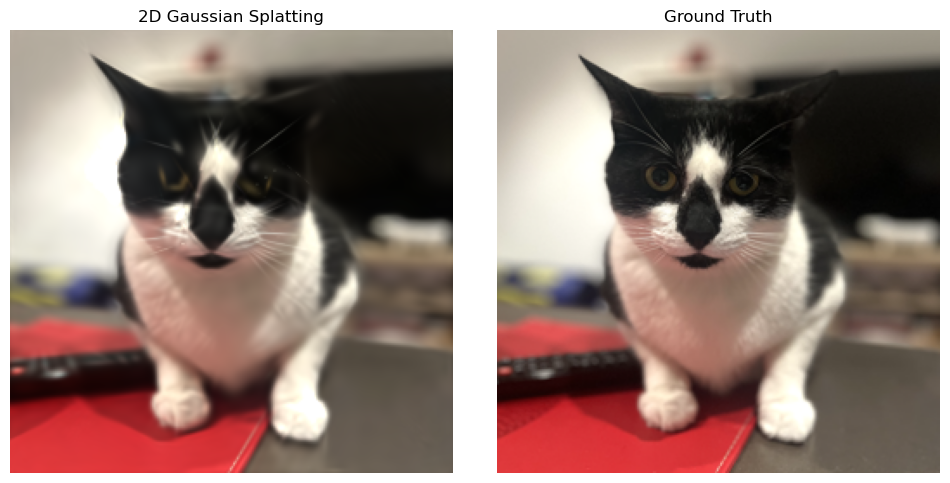

Epoch 2001/2001, Loss: 0.009325636550784111, on 2839 points


In [18]:
for epoch in range(num_epochs):

    #find indices to remove and update the persistent mask
    if epoch % (densification_interval + 1) == 0 and epoch > 0:
        indices_to_remove = (torch.sigmoid(W[:, 3]) < 0.01).nonzero(as_tuple=True)[0]

        if len(indices_to_remove) > 0:
          print(f"number of pruned points: {len(indices_to_remove)}")

        persistent_mask[indices_to_remove] = False

        # Zero-out parameters and their gradients at every epoch using the persistent mask
        W.data[~persistent_mask] = 0.0

  
    gc.collect()
    torch.cuda.empty_cache()

    output = W[persistent_mask]

    batch_size = output.shape[0]

    sigma_x = torch.sigmoid(output[:, 0])
    sigma_y = torch.sigmoid(output[:, 1])
    rho = torch.tanh(output[:, 2])
    alpha = torch.sigmoid(output[:, 3])
    colours = torch.sigmoid(output[:, 4:7])
    pixel_coords = torch.tanh(output[:, 7:9])

    colours_with_alpha  = colours * alpha.view(batch_size, 1)
    g_tensor_batch = generate_2D_gaussian_splatting(KERNEL_SIZE, sigma_x, sigma_y, rho, pixel_coords, colours_with_alpha, image_size, device)
    loss = combined_loss(g_tensor_batch, target_tensor, lambda_param=0.2)

    optimizer.zero_grad()

    loss.backward()

    # Apply zeroing out of gradients at every epoch
    if persistent_mask is not None:
        W.grad.data[~persistent_mask] = 0.0

    if epoch % densification_interval == 0 and epoch > 0:

      # Calculate the norm of gradients
      gradient_norms = torch.norm(W.grad[persistent_mask][:, 7:9], dim=1, p=2)
      gaussian_norms = torch.norm(torch.sigmoid(W.data[persistent_mask][:, 0:2]), dim=1, p=2)

      sorted_grads, sorted_grads_indices = torch.sort(gradient_norms, descending=True)
      sorted_gauss, sorted_gauss_indices = torch.sort(gaussian_norms, descending=True)

      large_gradient_mask = (sorted_grads > grad_threshold)
      large_gradient_indices = sorted_grads_indices[large_gradient_mask]

      large_gauss_mask = (sorted_gauss > gauss_threshold)
      large_gauss_indices = sorted_gauss_indices[large_gauss_mask]

      common_indices_mask = torch.isin(large_gradient_indices, large_gauss_indices)
      common_indices = large_gradient_indices[common_indices_mask]
      distinct_indices = large_gradient_indices[~common_indices_mask]

      # Split points with large coordinate gradient and large gaussian values and descale their gaussian
      if len(common_indices) > 0:
        print(f"number of splitted points: {len(common_indices)}")
        start_index = current_marker + 1
        end_index = current_marker + 1 + len(common_indices)
        persistent_mask[start_index: end_index] = True
        W.data[start_index:end_index, :] = W.data[common_indices, :]
        scale_reduction_factor = 1.6
        W.data[start_index:end_index, 0:2] /= scale_reduction_factor
        W.data[common_indices, 0:2] /= scale_reduction_factor
        current_marker = current_marker + len(common_indices)

      # Clone it points with large coordinate gradient and small gaussian values
      if len(distinct_indices) > 0:

        print(f"number of cloned points: {len(distinct_indices)}")
        start_index = current_marker + 1
        end_index = current_marker + 1 + len(distinct_indices)
        persistent_mask[start_index: end_index] = True
        W.data[start_index:end_index, :] = W.data[distinct_indices, :]
        current_marker = current_marker + len(distinct_indices)

    optimizer.step()

    loss_history.append(loss.item())

    if epoch % display_interval == 0:
        num_subplots = 3 if display_loss else 2
        fig_size_width = 18 if display_loss else 12

        fig, ax = plt.subplots(1, num_subplots, figsize=(fig_size_width, 6))  # Adjust subplot to 1x3

        generated_array = g_tensor_batch.cpu().detach().numpy()

        ax[0].imshow(g_tensor_batch.cpu().detach().numpy())
        ax[0].set_title('2D Gaussian Splatting')
        ax[0].axis('off')

        ax[1].imshow(target_tensor.cpu().detach().numpy())
        ax[1].set_title('Ground Truth')
        ax[1].axis('off')

        if display_loss:
          ax[2].plot(range(epoch + 1), loss_history[:epoch + 1])
          ax[2].set_title('Loss vs. Epochs')
          ax[2].set_xlabel('Epoch')
          ax[2].set_ylabel('Loss')
          ax[2].set_xlim(0, num_epochs)  # Set x-axis limits

        # Display the image
        #plt.show(block=False)
        plt.subplots_adjust(wspace=0.1)  # Adjust this value to your preference
        plt.pause(0.1)  # Brief pause

        img = Image.fromarray((generated_array * 255).astype(np.uint8))

        # Create filename
        filename = f"{epoch}.jpg"

        # Construct the full file path
        file_path = os.path.join(directory, filename)

        # Save the image
        img.save(file_path)

        fig.savefig(file_path, bbox_inches='tight')

        plt.clf()  # Clear the current figure
        plt.close()  # Close the current figure

        print(f"Epoch {epoch+1}/{num_epochs}, Loss: {loss.item()}, on {len(output)} points")

# Save as a video

In [20]:
image_files = []
for i in range(0, num_epochs, display_interval):
  image_files.append(f"{i}.jpg")

# Create a video writer object
writer = imageio.get_writer(os.path.join(directory, 'video.mp4'), fps=2)

# Add images to the video writer
for image_file in image_files:
    image_path = os.path.join(directory, image_file)
    image = imageio.imread(image_path)
    writer.append_data(image)

writer.close()

/var/folders/qp/tqq6vbr17jdgfssh6rzgm22r0000gn/T/ipykernel_64187/3940898492.py:11: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(image_path)
IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (950, 483) to (960, 496) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).
/var/folders/qp/tqq6vbr17jdgfssh6rzgm22r0000gn/T/ipykernel_64187/3940898492.py:11: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.